In [1]:
import pandas as pd

In [2]:
df = pd.read_csv('mnist_digit.csv')

In [3]:
df.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [4]:
from sklearn.model_selection import train_test_split

In [5]:
X = df.drop('label',axis=1)
y = df.label

In [6]:
x_train,x_test,y_train,y_test = train_test_split(X,y,test_size=0.25,random_state=123)

In [7]:
from sklearn.linear_model import LogisticRegression

In [8]:
log_reg = LogisticRegression()

In [9]:
log_reg.fit(x_train,y_train)

/home/ronak/.local/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [10]:
y_pred = log_reg.predict(x_test)

In [11]:
from sklearn.metrics import accuracy_score,f1_score,recall_score,precision_score

In [12]:
accuracy_score(y_test,y_pred)

0.9165714285714286

In [13]:
recall_score(y_test,y_pred,average='micro')

0.9165714285714286

In [14]:
precision_score(y_test,y_pred,average='micro')

0.9165714285714286

### SVC

In [15]:
from sklearn.svm import SVC

In [16]:
model = SVC()

In [17]:
model.fit(x_train,y_train)

SVC()

In [18]:
y_pred_svc = model.predict(x_test)

In [19]:
accuracy_score(y_test,y_pred_svc)

0.9765714285714285

In [20]:
recall_score(y_test,y_pred_svc,average='micro')

0.9765714285714285

In [21]:
precision_score(y_test,y_pred_svc,average='micro')

0.9765714285714285

In [22]:
df.label.unique()

array([1, 0, 4, 7, 3, 5, 8, 9, 2, 6])

### PCA

In [23]:
from sklearn.decomposition import PCA
import numpy as np

In [24]:
pca = PCA()

In [25]:
principal_component = pca.fit_transform(X)

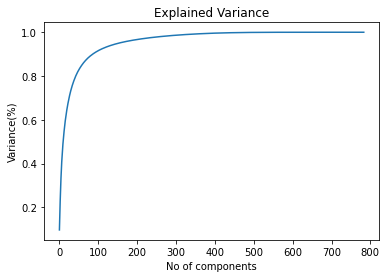

In [27]:
import matplotlib.pyplot as plt
plt.figure()
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('No of components')
plt.ylabel('Variance(%)')
plt.title('Explained Variance')
plt.show()

In [28]:
pca = PCA(n_components=125)
new_data = pca.fit_transform(X)
principal_df = pd.DataFrame(new_data)

In [29]:
principal_df

,0,1,2,3,4,5,6,7,8,9,...,115,116,117,118,119,120,121,122,123,124
0,-661.595780,-699.311328,183.282040,120.611395,-81.081810,489.461884,-683.470836,85.559386,348.548059,202.978531,...,0.943409,5.035133,10.181663,-48.063655,0.048400,-24.564593,5.820297,22.033297,-39.315154,-47.078550
1,1701.451685,-360.551556,-501.805594,335.423655,-442.378933,738.404051,653.875441,-176.600679,-7.520174,67.846265,...,41.410906,26.100382,-0.875384,1.870194,20.414150,89.834117,7.500585,-10.646985,10.049379,-88.776823
2,-886.894434,-293.765782,67.155310,78.263763,-473.715922,-323.540637,437.799102,-305.377729,-195.295501,-25.626041,...,12.769851,7.052727,-20.306342,42.468432,22.290831,35.632794,-25.478753,66.891404,-10.815242,-13.033975
3,-165.755602,300.182760,-64.145485,759.706261,-425.844379,157.390338,-304.099141,276.408973,-45.867225,-295.477565,...,-11.398604,63.712556,-124.827264,-55.253713,45.304999,-19.803003,45.883047,11.586346,-129.712227,1.720170
4,1923.709716,-449.153069,-548.613023,188.555147,-651.736273,990.063824,564.507039,-255.915213,124.914694,177.566836,...,38.270255,24.848974,72.099736,1.296775,106.393174,10.955172,14.561454,-67.130417,32.876506,-27.062983
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,760.355279,-249.854220,-406.991833,-322.864159,-1005.138838,556.384088,-272.098765,-633.014049,-164.416791,291.636342,...,28.906846,-3.362695,-45.453294,102.322185,-61.834736,67.651486,-92.464365,72.961893,-23.974031,64.464828
41996,-1059.873183,-302.292351,2.941099,38.667116,-360.053230,-150.786340,330.310064,-211.569841,118.315497,85.909744,...,39.267365,21.993049,3.003288,-25.656246,-17.682227,21.888237,4.092657,5.577702,-16.172213,38.026733
41997,336.269982,950.015280,-168.605414,-692.680963,-539.363843,29.198813,500.287809,653.349420,86.530017,102.243277,...,-97.312270,-4.645145,62.427288,23.158000,-6.277493,-3.132442,1.247491,-45.296734,172.564074,-21.663459
41998,327.399392,62.016089,697.536401,482.810439,-154.813777,-897.986233,402.210716,-114.409082,-163.944791,-130.402500,...,63.902582,-52.926171,37.959217,83.150108,0.611830,-34.119191,-11.320889,2.712866,-104.538610,15.702601


ranges are too different

In [30]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [31]:
scaled_principal_df = scaler.fit_transform(principal_df)
scaled_principal_df

array([[-1.14345153, -1.410294  ,  0.39896126, ...,  0.46638683,
        -0.83958929, -1.01573108],
       [ 2.94065892, -0.72712063, -1.09231102, ..., -0.22536862,
         0.21460811, -1.9153814 ],
       [-1.53284049, -0.59243445,  0.14618108, ...,  1.41591473,
        -0.23096339, -0.28121115],
       ...,
       [ 0.58118331,  1.9158861 , -0.36701375, ..., -0.95881249,
         3.68516805, -0.46739436],
       [ 0.56585206,  0.12506721,  1.51837028, ...,  0.05742422,
        -2.23245972,  0.33878741],
       [-0.62954045,  0.84477728,  0.1369179 , ..., -0.33653904,
         0.88285302,  0.88472625]])

In [32]:
scaled_principal_df = pd.DataFrame(scaled_principal_df)
scaled_principal_df

,0,1,2,3,4,5,6,7,8,9,...,115,116,117,118,119,120,121,122,123,124
0,-1.143452,-1.410294,0.398961,0.280627,-0.197781,1.273286,-2.037427,0.271497,1.130757,0.714701,...,0.018809,0.101388,0.206298,-0.981229,0.001007,-0.513508,0.123021,0.466387,-0.839589,-1.015731
1,2.940659,-0.727121,-1.092311,0.780431,-1.079082,1.920885,1.949203,-0.560388,-0.024397,0.238891,...,0.825601,0.525558,-0.017737,0.038180,0.424628,1.877930,0.158537,-0.225369,0.214608,-1.915381
2,-1.532840,-0.592434,0.146181,0.182096,-1.155522,-0.841659,1.305079,-0.969023,-0.633576,-0.090231,...,0.254590,0.142014,-0.411442,0.867002,0.463664,0.744883,-0.538534,1.415915,-0.230963,-0.281211
3,-0.286479,0.605376,-0.139629,1.767610,-1.038750,0.409435,-0.906520,0.877100,-0.148802,-1.040396,...,-0.227252,1.282917,-2.529218,-1.128016,0.942375,-0.413970,0.969811,0.245252,-2.770051,0.037113
4,3.324793,-0.905802,-1.194200,0.438712,-1.589761,2.575552,1.682796,-0.812069,0.405247,0.625224,...,0.762987,0.500359,1.460866,0.026474,2.213050,0.229011,0.307779,-1.420974,0.702090,-0.583890
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,1.314140,-0.503878,-0.885924,-0.751209,-2.451806,1.447378,-0.811127,-2.008677,-0.533400,1.026871,...,0.576310,-0.067711,-0.920963,2.088928,-1.286204,1.414215,-1.954380,1.544411,-0.511974,1.390844
41996,-1.831804,-0.609630,0.006402,0.089967,-0.878267,-0.392256,0.984655,-0.671352,0.383838,0.302494,...,0.782866,0.442853,0.060852,-0.523777,-0.367802,0.457561,0.086505,0.118065,-0.345363,0.820436
41997,0.581183,1.915886,-0.367014,-1.611662,-1.315655,0.075958,1.491358,2.073205,0.280720,0.360005,...,-1.940096,-0.093535,1.264886,0.472775,-0.130576,-0.065482,0.026368,-0.958812,3.685168,-0.467394
41998,0.565852,0.125067,1.518370,1.123356,-0.377633,-2.336022,1.198990,-0.363042,-0.531869,-0.459156,...,1.274014,-1.065723,0.769120,1.697526,0.012726,-0.713242,-0.239285,0.057424,-2.232460,0.338787


#### logistic regression after PCA

In [33]:
x_train_p,x_test_p,y_train_p,y_test_p = train_test_split(scaled_principal_df,y,test_size=0.25,random_state=123)

In [34]:
log_reg_pca = LogisticRegression()

In [35]:
log_reg_pca.fit(x_train_p,y_train_p)

/home/ronak/.local/lib/python3.8/site-packages/sklearn/linear_model/_logistic.py:763: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


LogisticRegression()

In [36]:
y_pred_p = log_reg_pca.predict(x_test_p)

In [37]:
accuracy_score(y_test_p,y_pred_p)

0.9197142857142857

In [38]:
recall_score(y_test_p,y_pred_p,average='micro')

0.9197142857142857

In [39]:
precision_score(y_test_p,y_pred_p,average='micro')

0.9197142857142857

#### SVC after PCA

In [40]:
svm_pca = SVC()

In [41]:
svm_pca.fit(x_train_p,y_train_p)

SVC()

In [42]:
y_pred_svm = svm_pca.predict(x_test_p)

In [43]:
accuracy_score(y_test_p,y_pred_svm)

0.9732380952380952

#### graph


In [44]:
scaled_principal_df

,0,1,2,3,4,5,6,7,8,9,...,115,116,117,118,119,120,121,122,123,124
0,-1.143452,-1.410294,0.398961,0.280627,-0.197781,1.273286,-2.037427,0.271497,1.130757,0.714701,...,0.018809,0.101388,0.206298,-0.981229,0.001007,-0.513508,0.123021,0.466387,-0.839589,-1.015731
1,2.940659,-0.727121,-1.092311,0.780431,-1.079082,1.920885,1.949203,-0.560388,-0.024397,0.238891,...,0.825601,0.525558,-0.017737,0.038180,0.424628,1.877930,0.158537,-0.225369,0.214608,-1.915381
2,-1.532840,-0.592434,0.146181,0.182096,-1.155522,-0.841659,1.305079,-0.969023,-0.633576,-0.090231,...,0.254590,0.142014,-0.411442,0.867002,0.463664,0.744883,-0.538534,1.415915,-0.230963,-0.281211
3,-0.286479,0.605376,-0.139629,1.767610,-1.038750,0.409435,-0.906520,0.877100,-0.148802,-1.040396,...,-0.227252,1.282917,-2.529218,-1.128016,0.942375,-0.413970,0.969811,0.245252,-2.770051,0.037113
4,3.324793,-0.905802,-1.194200,0.438712,-1.589761,2.575552,1.682796,-0.812069,0.405247,0.625224,...,0.762987,0.500359,1.460866,0.026474,2.213050,0.229011,0.307779,-1.420974,0.702090,-0.583890
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,1.314140,-0.503878,-0.885924,-0.751209,-2.451806,1.447378,-0.811127,-2.008677,-0.533400,1.026871,...,0.576310,-0.067711,-0.920963,2.088928,-1.286204,1.414215,-1.954380,1.544411,-0.511974,1.390844
41996,-1.831804,-0.609630,0.006402,0.089967,-0.878267,-0.392256,0.984655,-0.671352,0.383838,0.302494,...,0.782866,0.442853,0.060852,-0.523777,-0.367802,0.457561,0.086505,0.118065,-0.345363,0.820436
41997,0.581183,1.915886,-0.367014,-1.611662,-1.315655,0.075958,1.491358,2.073205,0.280720,0.360005,...,-1.940096,-0.093535,1.264886,0.472775,-0.130576,-0.065482,0.026368,-0.958812,3.685168,-0.467394
41998,0.565852,0.125067,1.518370,1.123356,-0.377633,-2.336022,1.198990,-0.363042,-0.531869,-0.459156,...,1.274014,-1.065723,0.769120,1.697526,0.012726,-0.713242,-0.239285,0.057424,-2.232460,0.338787


In [45]:
scaled_principal_df.columns

RangeIndex(start=0, stop=125, step=1)

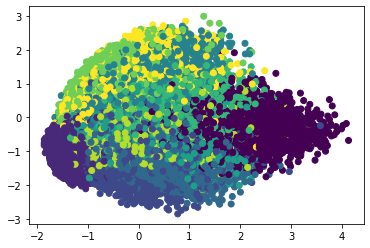

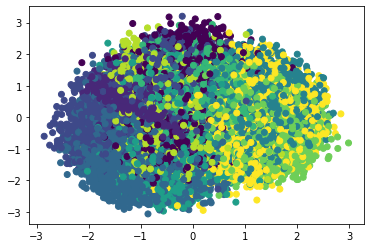

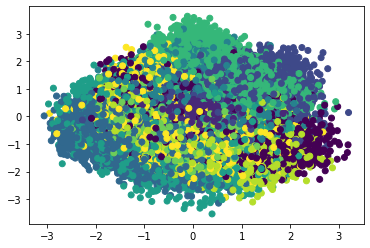

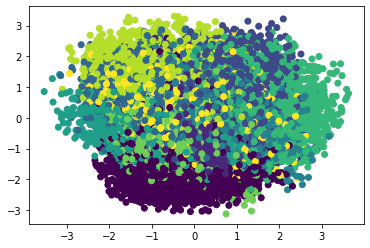

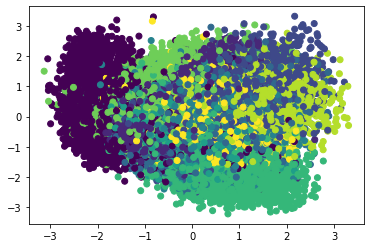

...

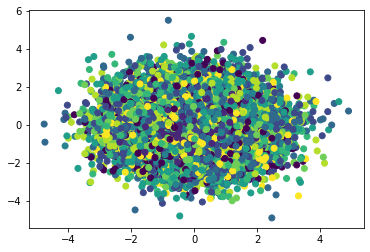

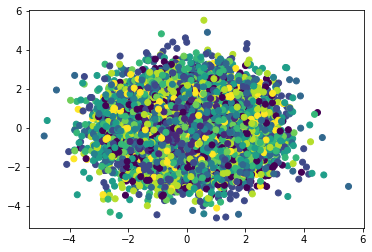

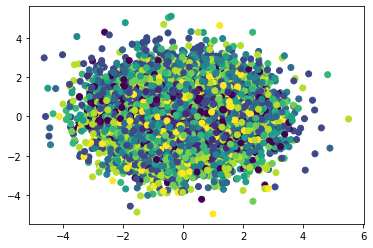

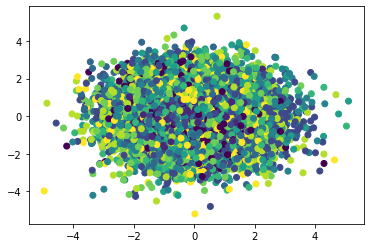

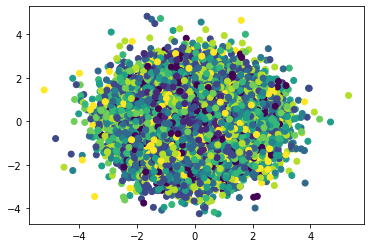

In [53]:
for i in scaled_principal_df.columns:
    if i<=123:
        plot = plt.scatter(scaled_principal_df[i],scaled_principal_df[i+1],c=y)
        plt.show()
        i+=2
    else:
        break

### Comparision

|Algorithm||Before PCA Accuracy||After PCA Accuracy|
|---||---||---|
|Logistic Regression||91.6571%||91.9714%|
|SVM||97.6571%||97.3238%|